# Analyse GSE129605

Erklärung des Datensatzes

In [1]:
import scanpy
import os
import gzip
import shutil
from tqdm.notebook import tqdm
import anndata
import matplotlib.pyplot as plt
import helpers_danielstrobel
plt.rcParams['figure.figsize'] = (15, 15)

### Download Dataset [Here](https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE129605&format=file) and put into working directory

In [5]:
path = "GSE129605_RAW"

In [6]:
# only run if files are not renamed

# rename the files -> new folders each containing three files
for filename in os.listdir(path):

    old_path = os.path.join(path, filename)
    folder_path = "_".join(old_path.split("_")[:-1])
    file_name = old_path.split("_")[-1]
    new_path = os.path.join(folder_path, file_name)

    os.makedirs(os.path.dirname(new_path), exist_ok=True)
    os.rename(old_path, new_path)

In [7]:
# only run if files are not extracted

for folder in os.listdir(path):
    folder_path = os.path.join(path, folder)
    for filename in os.listdir(folder_path):

        file_path = os.path.join(folder_path, filename)
        if filename.endswith(".gz"):

            with gzip.open(file_path, "rb") as f_in:
               with open(file_path[:-3], "wb") as f_out:
                    shutil.copyfileobj(f_in, f_out)

            os.remove(file_path)

In [8]:
# dann loop über die ordner und die Methode ausführen → anndata files
anndatas = {}
for folder in tqdm(os.listdir(path)):
    anndatas[folder] = scanpy.read_10x_mtx(os.path.join(path, folder))

  0%|          | 0/11 [00:00<?, ?it/s]

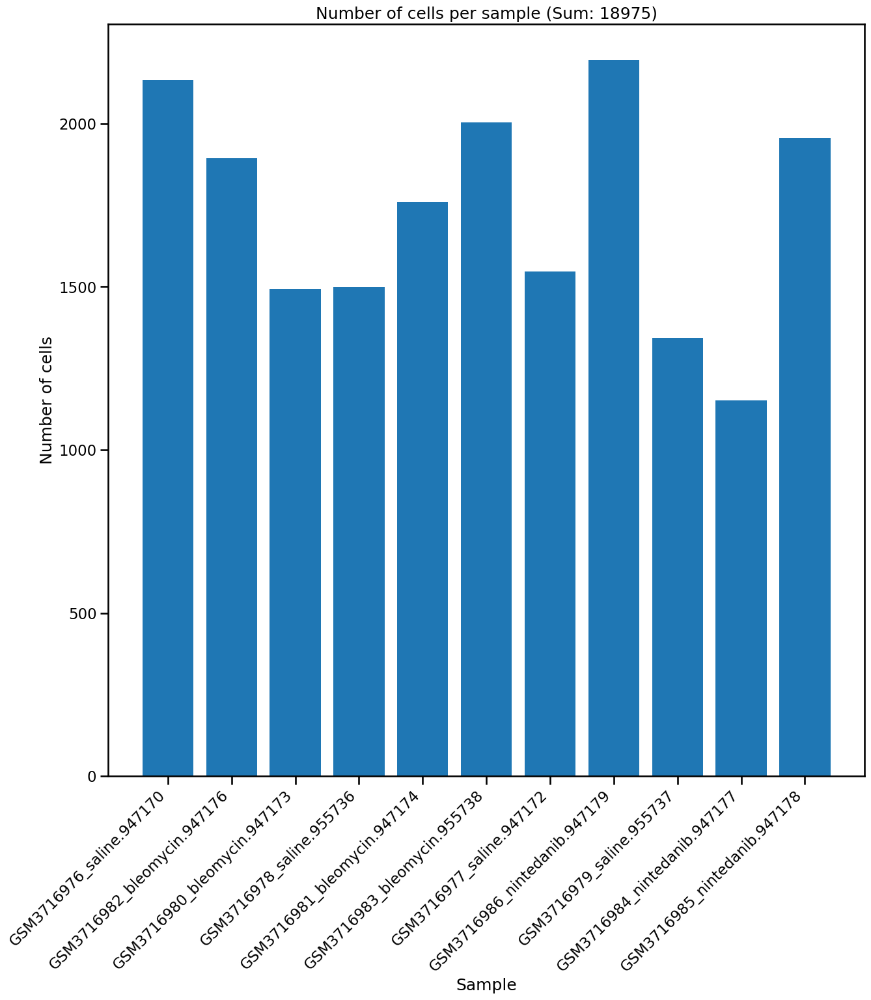

In [9]:
#plot n_obs

# Liste mit den Anzahlen der Beobachtungen für jedes Anndata-Objekt
n_obs_list = [data.n_obs for data in anndatas.values()]

# X-Achsenbeschriftungen
x_labels = anndatas.keys()

# Erstelle ein Bar-Chart-Diagramm
fig, ax = plt.subplots()
ax.bar(x_labels, n_obs_list)

# Diagramm-Titel und Achsenbeschriftungen
ax.set_title(f'Number of cells per sample (Sum: {sum(n_obs_list)})')
ax.set_xlabel('Sample')
ax.set_ylabel('Number of cells')

# Rotiere X-Achsenbeschriftungen, falls sie zu lang sind
plt.xticks(rotation=45, ha='right')

# Zeige das Diagramm
plt.show()

In [10]:
# concatenate anndata files
dataset = anndata.concat(anndatas, label="samples")

#make obs names unique
dataset.obs_names_make_unique()

#split column into condition, GSM and id
dataset.obs[['GSM', 'tmp']] = dataset.obs['samples'].str.split("_", expand = True)
dataset.obs[['condition', 'id']] = dataset.obs['tmp'].str.split(".", expand = True)

dataset.obs.drop(columns=['tmp'], inplace=True)

dataset.obs

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


,samples,GSM,condition,id
AAACCTGAGGAATTAC-1,GSM3716976_saline.947170,GSM3716976,saline,947170
AAACCTGCATAACCTG-1,GSM3716976_saline.947170,GSM3716976,saline,947170
AAACCTGCATTGGGCC-1,GSM3716976_saline.947170,GSM3716976,saline,947170
AAACCTGGTCTCAACA-1,GSM3716976_saline.947170,GSM3716976,saline,947170
AAACCTGGTTGACGTT-1,GSM3716976_saline.947170,GSM3716976,saline,947170
...,...,...,...,...
TTTGCGCCAGACAAGC-1,GSM3716985_nintedanib.947178,GSM3716985,nintedanib,947178
TTTGCGCGTCATATGC-1,GSM3716985_nintedanib.947178,GSM3716985,nintedanib,947178
TTTGCGCGTCCGAATT-1,GSM3716985_nintedanib.947178,GSM3716985,nintedanib,947178
TTTGGTTGTAGCTTGT-1,GSM3716985_nintedanib.947178,GSM3716985,nintedanib,947178


In [11]:
# Berechnen der Nachbarschaften
scanpy.pp.neighbors(dataset)
# Reduzieren der Dimensionen mit UMAP
scanpy.tl.umap(dataset)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/anndata/_core/anndata.py:447: PendingDeprecationWarning: The dtype argument will be deprecated in anndata 0.10.0
  warnings.warn(
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


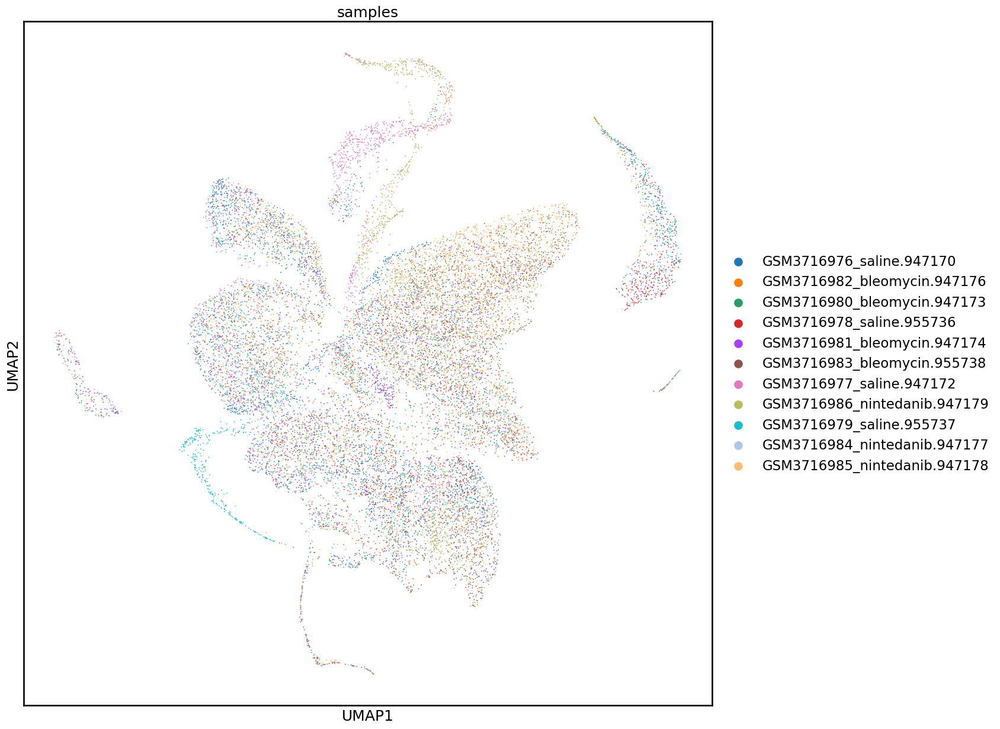

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


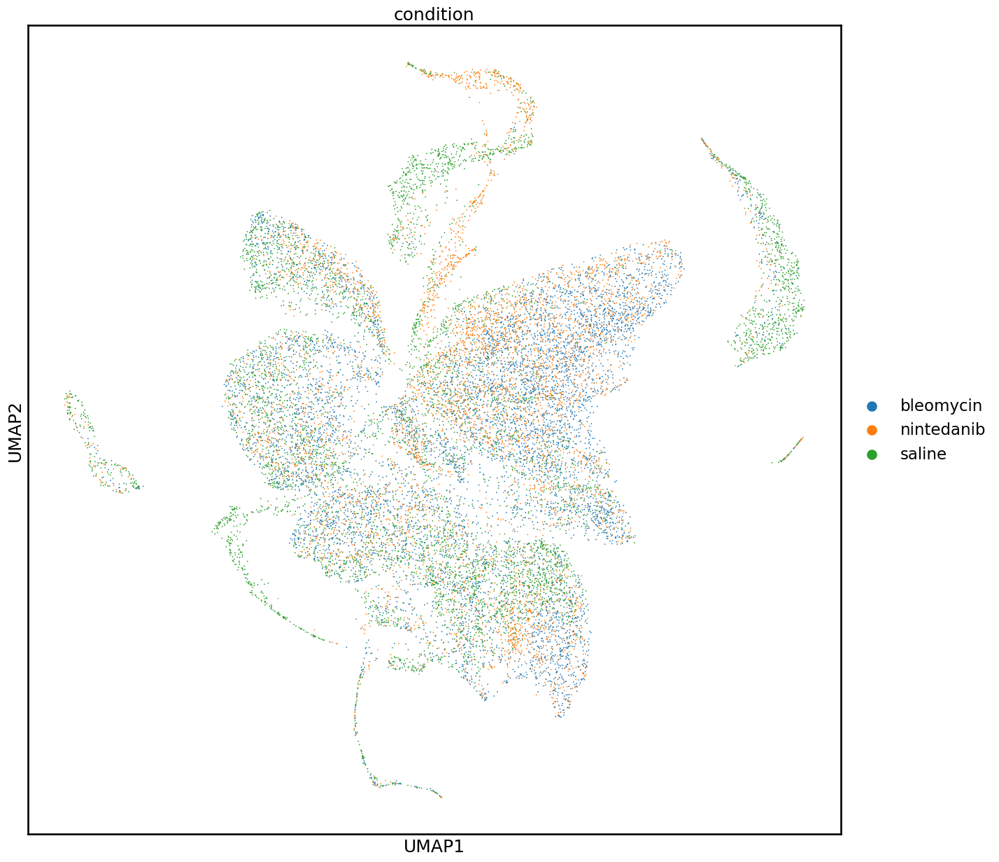

In [12]:
scanpy.pl.umap(adata=dataset, color=["samples"])
scanpy.pl.umap(adata=dataset, color=["condition"])

In [13]:
scanpy.pp.filter_cells(dataset, min_genes=350)
scanpy.pp.filter_cells(dataset, max_genes=6100)
scanpy.pp.filter_cells(dataset, max_counts=40000)

In [14]:
n_genes = dataset.n_vars
print(f'The dataset contains {n_genes} genes.')
# filter out lowly expressed genes
min_expression = 0
dataset = dataset[:, dataset.X.mean(axis=0) > min_expression]

# count the number of genes after filtering
n_genes_filtered = dataset.n_vars
print(f'After filtering, the dataset contains {n_genes_filtered} genes.')

The dataset contains 25127 genes.
After filtering, the dataset contains 19472 genes.


In [15]:
#didnt work R error
#scib.pp.normalize(dataset)

scanpy.pp.normalize_total(dataset)
scanpy.pp.log1p(dataset)
scanpy.pp.pca(dataset, n_comps=15)
scanpy.pp.neighbors(dataset)
scanpy.tl.leiden(dataset, key_added="groups")
scanpy.pp.highly_variable_genes(dataset)

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [17]:
scanpy.tl.umap(dataset)

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


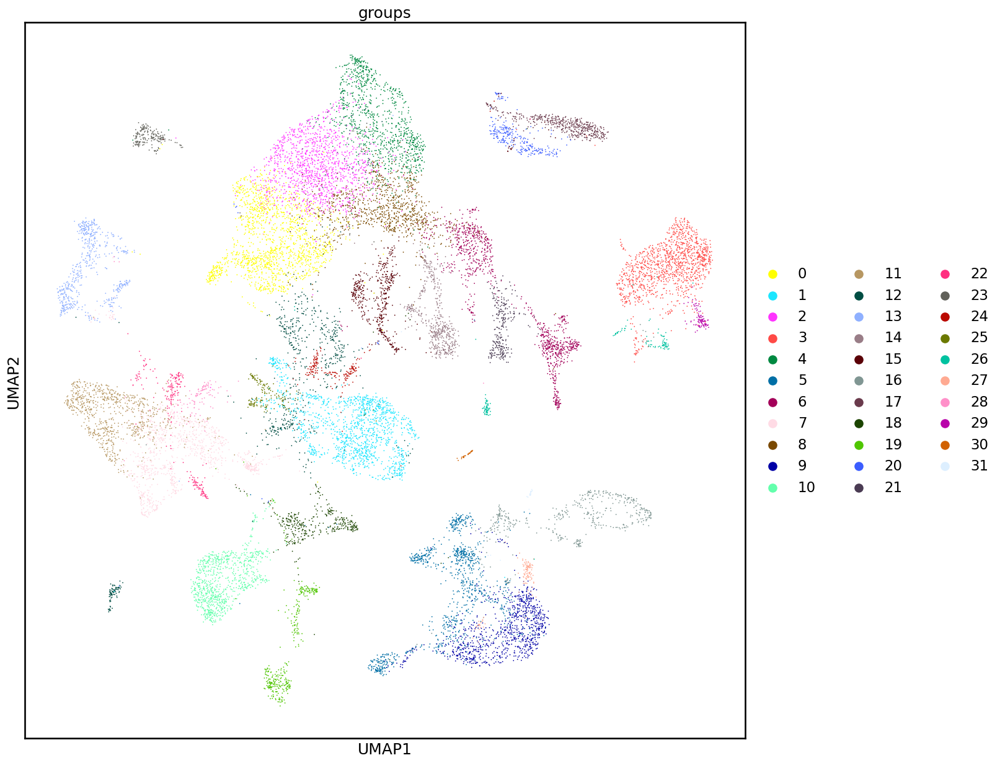

/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


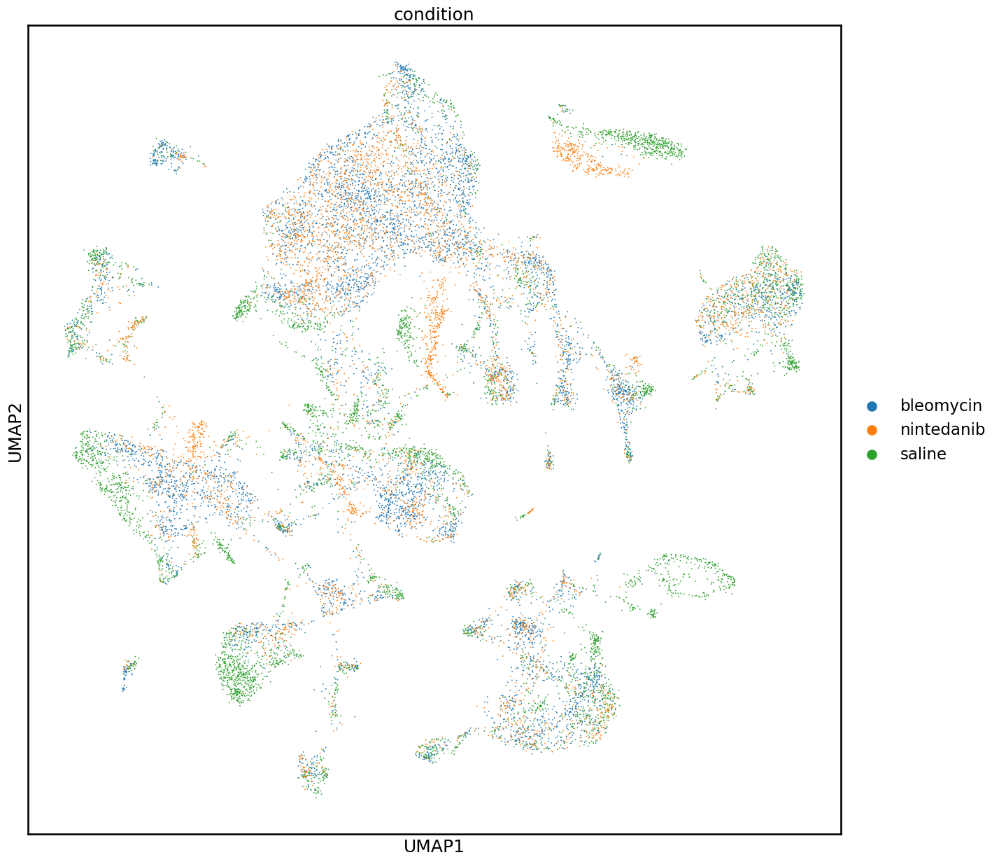

In [18]:
scanpy.pl.umap(dataset, color=['groups'])
scanpy.pl.umap(dataset, color=['condition'])

Macrophages


/Users/leahollenberg/Desktop/Masterpraktikum/PycharmProjects/scanpy_start/venv/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


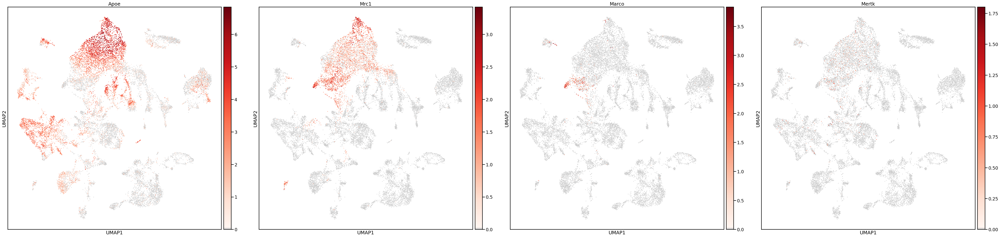

Monocytes


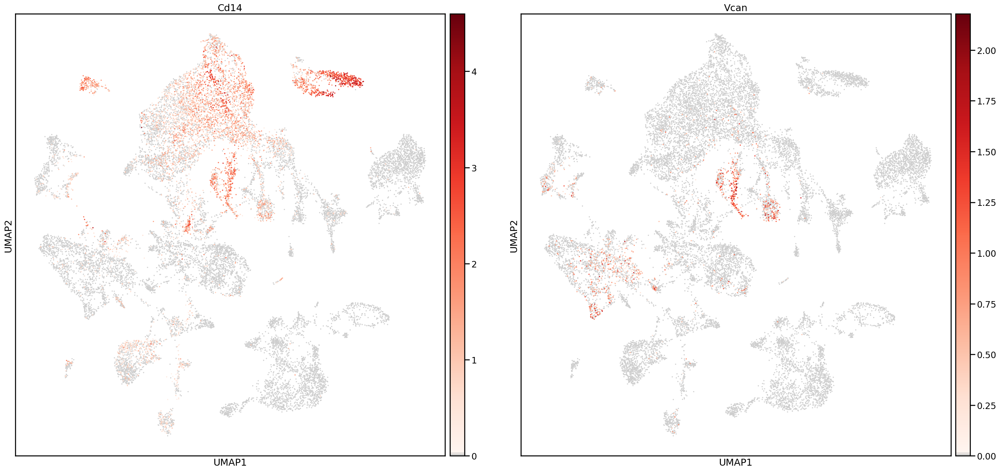

T-Cells


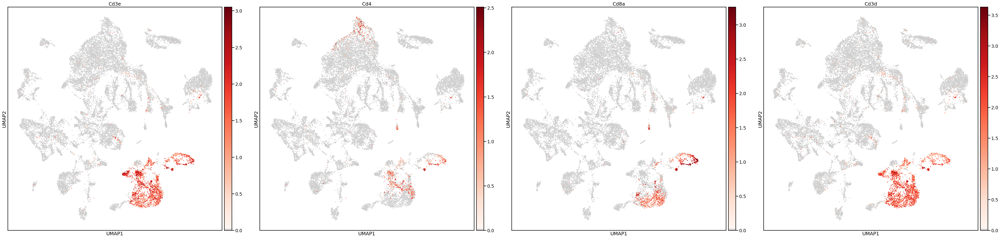

B-Cells


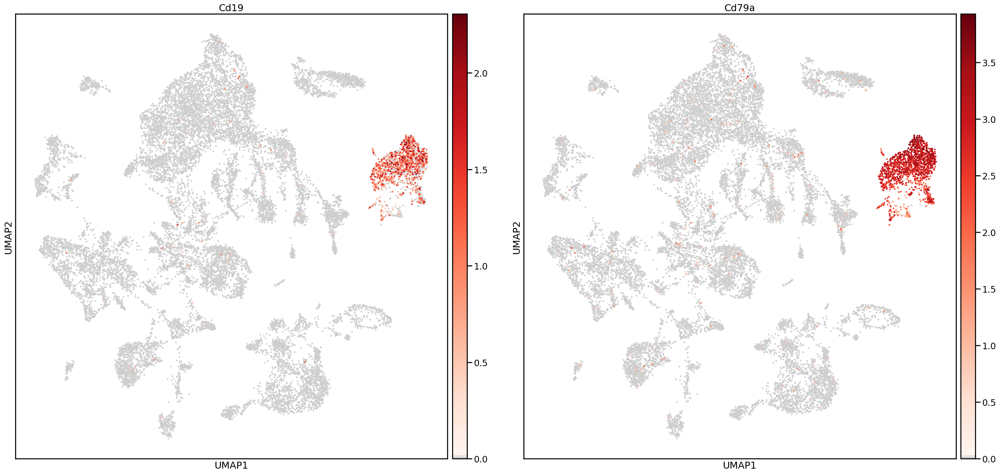

AT2


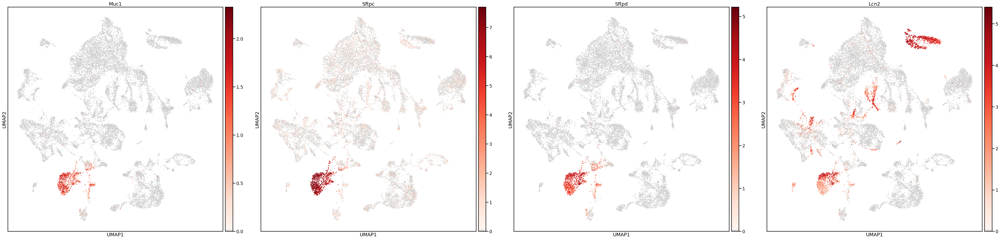

AT1


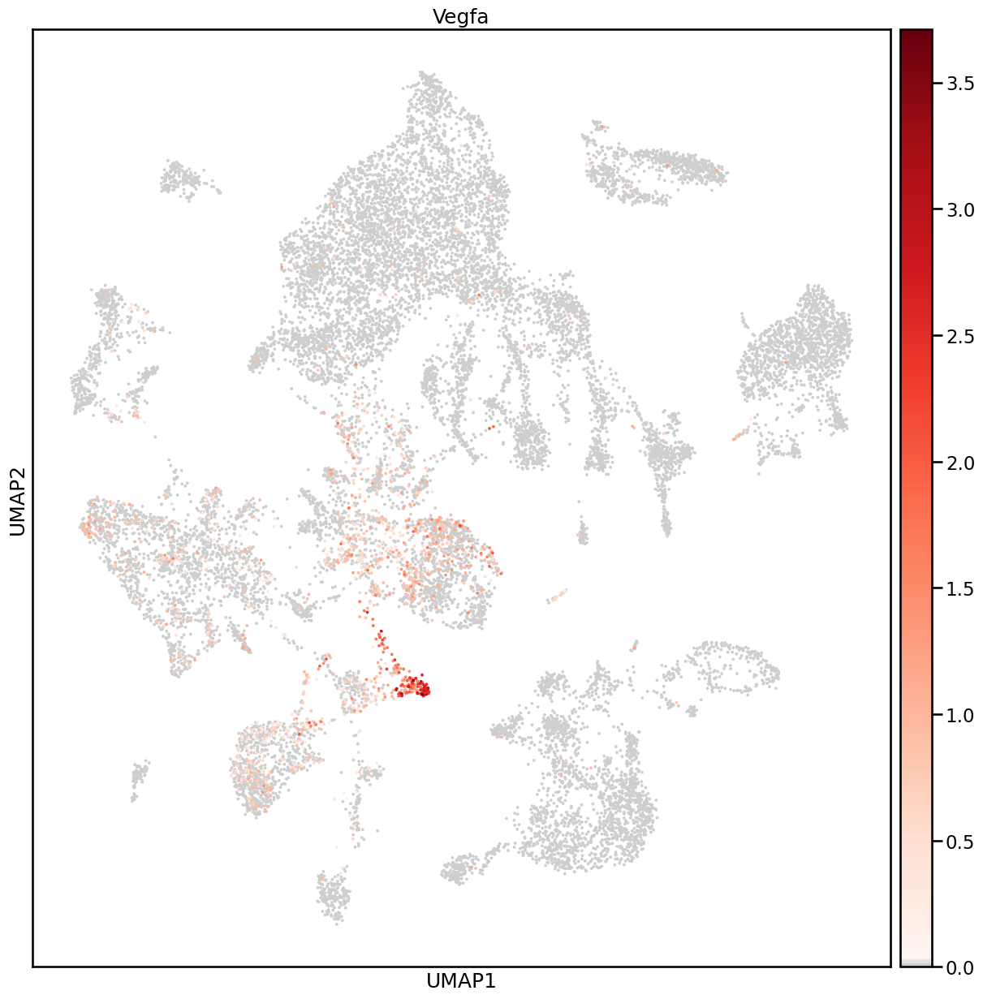

Krt8


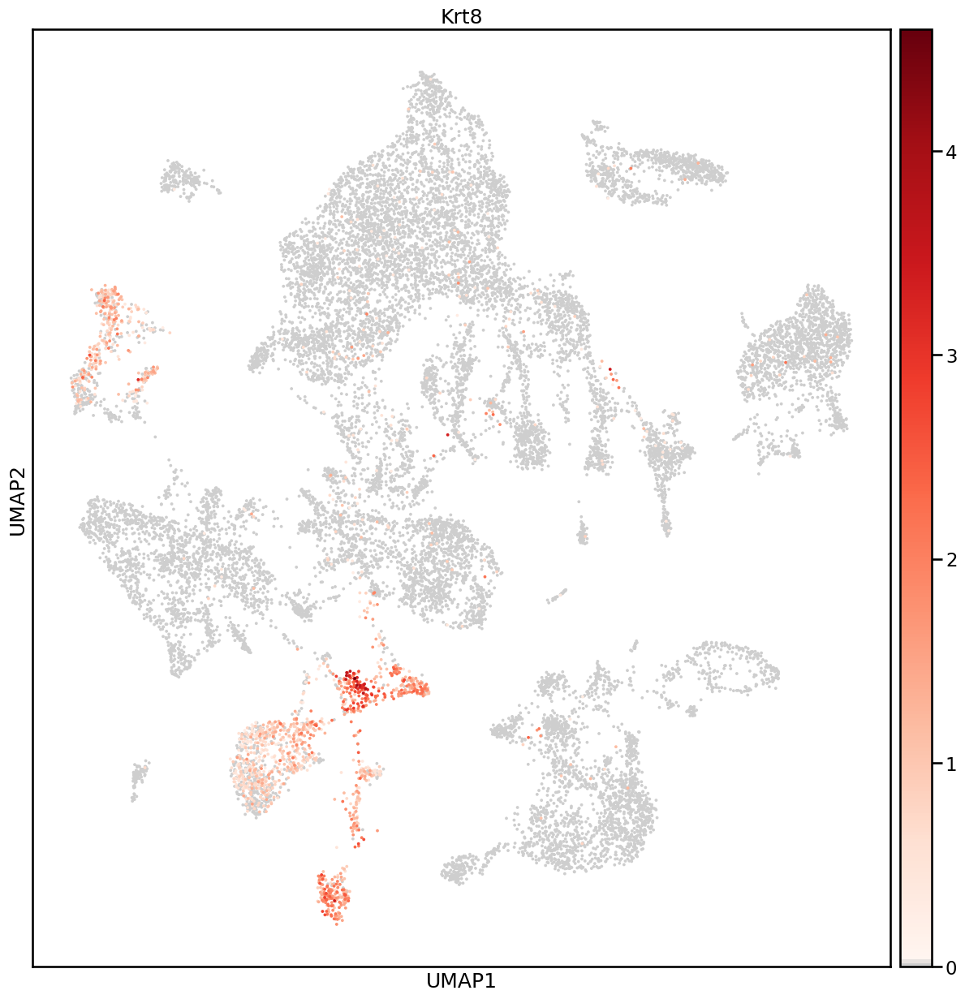

Endothelial


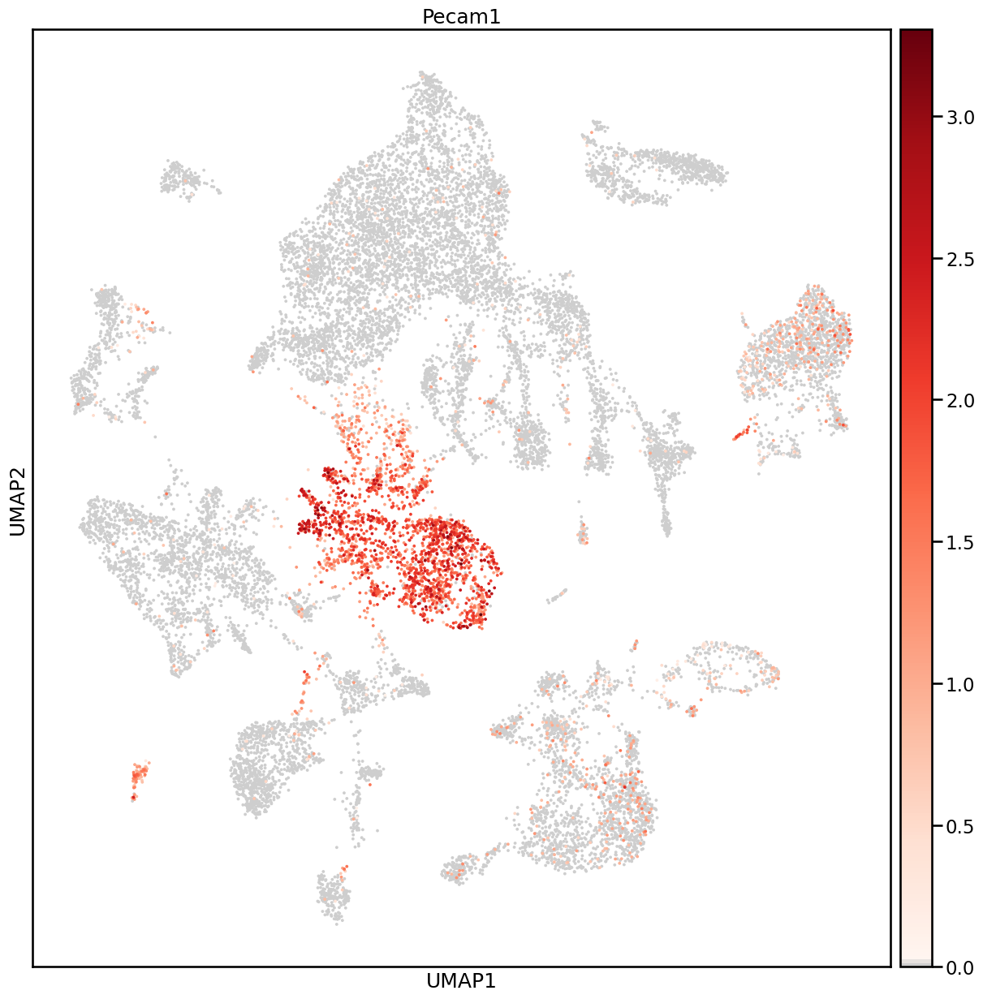

Fibroblasts


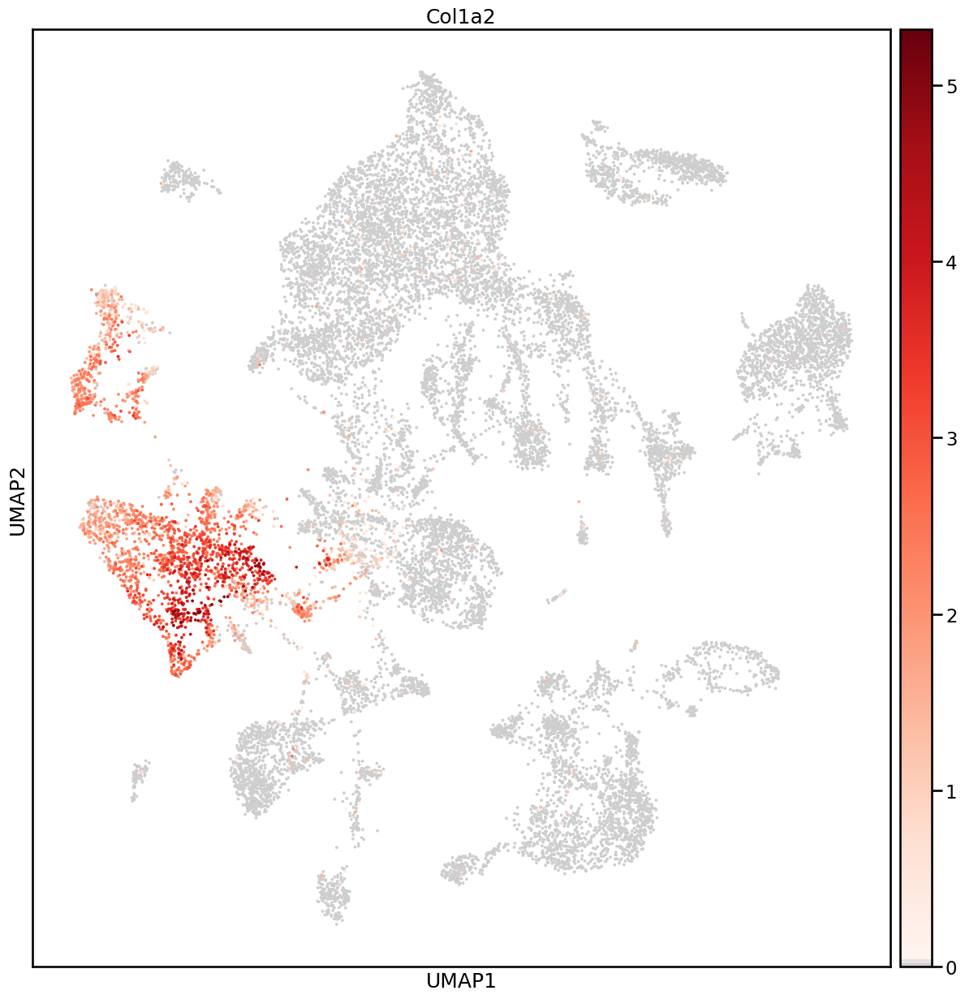

Myofibroblasts


In [ ]:
helpers_danielstrobel.plot_markers(dataset)

In [ ]:
scanpy.tl.louvain(dataset, resolution=0.4)

In [ ]:
scanpy.pl.umap(dataset, color='louvain', size=20, legend_loc='on data')

In [ ]:
scanpy.pl.umap(dataset, color='groups', size=20, legend_loc='on data')